# Описание файла

В файле **baseline** реализован базовый этап ML‑пайплайна для прогнозирования отклика на депозитную кампанию.

Сначала изучена структура данных (демографические, финансовые и коммуникационные признаки) и проверена их корректность — пропусков нет, типы и кодирование согласованы. Затем проанализированы взаимосвязи признаков и выявлен ряд сильных предикторов (например, duration, отдельные категории job). На основе выводов определён план дальнейшей работы: кодирование категориальных переменных, трансформация числовых (в т. ч. логарифмирование), подбор устойчивых к дисбалансу метрик.

**Описание признаков**

Датасет имеет следующие признаки/столбцы:
| Столбец   | Перевод                   | Описание                                                                                 |
| --------- | ------------------------- | ---------------------------------------------------------------------------------------- |
| age       | Возраст                   | Возраст клиента в годах                                                                  |
| job       | Работа                    | Тип занятости клиента (например, администратор, инженер, пенсионер и т.д.)               |
| marital   | Семейное положение        | Семейный статус клиента (замужем/женат, холост, в разводе и т.д.)                        |
| education | Образование               | Уровень образования клиента (среднее, высшее и т.д.)                                     |
| default   | Кредитный дефолт          | Есть ли у клиента невыполненные кредитные обязательства (да/нет)                         |
| balance   | Баланс                    | Среднегодовой баланс клиента в евро                                                      |
| housing   | Жилищный кредит           | Есть ли у клиента ипотечный кредит (да/нет)                                              |
| loan      | Личный кредит             | Есть ли у клиента персональный кредит (да/нет)                                           |
| contact   | Тип связи                 | Тип последней коммуникации с клиентом (телефон, email и т.д.)                            |
| day       | День                      | День месяца последнего контакта                                                          |
| month     | Месяц                     | Месяц последнего контакта                                                                |
| duration  | Длительность              | Длительность последнего контакта в секундах                                              |
| campaign  | Кампания                  | Количество контактов, проведённых для этого клиента во время текущей кампании            |
| pdays     | Дней с прошлого контакта  | Количество дней, прошедших с момента последнего контакта в предыдущей кампании           |
| previous  | Предыдущие контакты       | Количество контактов, проведённых для этого клиента до текущей кампании                  |
| poutcome  | Исход предыдущей кампании | Результат предыдущей маркетинговой кампании (успех, неудача, отсутствие контакта и т.д.) |
| deposit   | Депозит                   | Целевая переменная: оформил ли клиент депозит после текущей кампании (да/нет)            |

Этот набор признаков позволяет проанализировать демографические, финансовые и поведенческие характеристики клиентов, а также оценить эффективность маркетинговых коммуникаций.

# Импорт основных библиотек

In [1]:
# импорт модулей/библиотек для обработки данных
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
import seaborn as sns
from my_def_and_plot import *
from plots import *
import random

In [2]:
# импорт необходимого окружения для визуализации
# отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')

# будем отображать графики прямо в jupyter'e
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
import pandas as pd

In [3]:
# фиксируем состояние генератора псевдослучайных чисел. Это необходимо, чтобы результаты модели не менялись с каждым новым запуском 
SEED = 42 # можно указать любое число
np.random.seed(SEED)
random.seed(SEED)

# 1. Изучение структуры данных

In [4]:
# выгрузка данных и последущий сбор информации о структуре данных
df = pd.read_csv('bank.csv')

# вывод основных характеристик данных (тип признаков, пропуски, структура ...)
df.info()

# явный вывод количеств строк и столбцов
count_rows, count_column = df.shape

print(f'Исходный датафрейм содержит {count_rows} строк и {count_column} столбцов')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB
Исходный датафрейм содержит 11162 строк и 17 столбцов


In [5]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [6]:
# для удобства EDA, введем список количественных и качественных признаков (используем списковое включение)

numerical_features = [x for x in df.columns if pd.api.types.is_numeric_dtype(df[x])]

categorical_features = [x for x in df.columns if not pd.api.types.is_numeric_dtype(df[x])]

In [7]:
print(f'{len(df[numerical_features].columns)} количественных признаков:{list(df[numerical_features])}')
print(f'{len(df[categorical_features].columns)} качественных признаков:{list(df[categorical_features])}')

7 количественных признаков:['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
10 качественных признаков:['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'deposit']


In [8]:
# вывод статистики количесвенных призанков
print(df[numerical_features].describe())

                age       balance           day      duration      campaign  \
count  11162.000000  11162.000000  11162.000000  11162.000000  11162.000000   
mean      41.231948   1528.538524     15.658036    371.993818      2.508421   
std       11.913369   3225.413326      8.420740    347.128386      2.722077   
min       18.000000  -6847.000000      1.000000      2.000000      1.000000   
25%       32.000000    122.000000      8.000000    138.000000      1.000000   
50%       39.000000    550.000000     15.000000    255.000000      2.000000   
75%       49.000000   1708.000000     22.000000    496.000000      3.000000   
max       95.000000  81204.000000     31.000000   3881.000000     63.000000   

              pdays      previous  
count  11162.000000  11162.000000  
mean      51.330407      0.832557  
std      108.758282      2.292007  
min       -1.000000      0.000000  
25%       -1.000000      0.000000  
50%       -1.000000      0.000000  
75%       20.750000      1.000000  


* *balance*: огромный разброс (от −6847 до 81 204) и большая дисперсия — почти наверняка есть сильные выбросы. Отрицательный баланс тоже интересен: это долг/овердрафт или ошибка;
* *duration*: максимум 3881 — это почти 65 минут. Для звонка это очень много: либо редкие аномальные случаи, либо нужно проверить единицы измерения;
* *pdays*: значение −1 почти у половины наблюдений (50% = −1). Скорее всего, это кодировка «клиент не контактировали ранее». Это не выброс, а специальный маркер;
* *age*: распределение выглядит нормальным, но стоит проверить хвосты (95 лет — возможно, редкие кейсы);
* *campaign*: максимум 63 контакта с клиентом — это очень много. Стоит посмотреть, сколько таких строк и как они влияют на целевую переменную.


# 2. Проверка на корректность и качество данных

## 2.1 Проверка на дубликаты

In [9]:
# проверка наличия явных дубликатов в датасете
df.duplicated().sum()

0

Дубликатов в датафрейме нет!

## 2.2 Поиск пропусков в датафрейме

In [10]:
df.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

Пропусков в датафрейме нет!

## 2.3  Проверка корректности элементов в соответствующих признаках

In [11]:
# проверка признаков на наличия иных элементов (бинарыне признаки - два элемента, третьего не дано)
print(df[categorical_features].describe())

               job  marital  education default housing   loan   contact  \
count        11162    11162      11162   11162   11162  11162     11162   
unique          12        3          4       2       2      2         3   
top     management  married  secondary      no      no     no  cellular   
freq          2566     6351       5476   10994    5881   9702      8042   

        month poutcome deposit  
count   11162    11162   11162  
unique     12        4       2  
top       may  unknown      no  
freq     2824     8326    5873  


## 2.4 Анализ количественных признаков

In [12]:
# вывод статистики количесвенных призанков
print(df[numerical_features].describe())

                age       balance           day      duration      campaign  \
count  11162.000000  11162.000000  11162.000000  11162.000000  11162.000000   
mean      41.231948   1528.538524     15.658036    371.993818      2.508421   
std       11.913369   3225.413326      8.420740    347.128386      2.722077   
min       18.000000  -6847.000000      1.000000      2.000000      1.000000   
25%       32.000000    122.000000      8.000000    138.000000      1.000000   
50%       39.000000    550.000000     15.000000    255.000000      2.000000   
75%       49.000000   1708.000000     22.000000    496.000000      3.000000   
max       95.000000  81204.000000     31.000000   3881.000000     63.000000   

              pdays      previous  
count  11162.000000  11162.000000  
mean      51.330407      0.832557  
std      108.758282      2.292007  
min       -1.000000      0.000000  
25%       -1.000000      0.000000  
50%       -1.000000      0.000000  
75%       20.750000      1.000000  


* *balance*: огромный разброс (от −6847 до 81 204) и большая дисперсия — почти наверняка есть сильные выбросы. Отрицательный баланс тоже интересен: это долг/овердрафт или ошибка;
* *duration*: максимум 3881 — это почти 65 минут. Для звонка это очень много: либо редкие аномальные случаи, либо нужно проверить единицы измерения;
* *pdays*: значение −1 почти у половины наблюдений (50% = −1). Скорее всего, это кодировка «клиент не контактировали ранее». Это не выброс, а специальный маркер;
* *age*: распределение выглядит нормальным, но стоит проверить хвосты (95 лет — возможно, редкие кейсы);
* *campaign*: максимум 63 контакта с клиентом — это очень много. Стоит посмотреть, сколько таких строк и как они влияют на целевую переменную.

*Анализ признака **balance***:
* *balance* имеет огромный разброс (от −6847 до 81 204) и большую дисперсия — почти наверняка есть сильные выбросы. Отрицательный баланс тоже интересен: это долг/овердрафт или ошибка;
* отрициательные значения не удаляем, а создаем новые признаки для модели.

In [13]:
# ввод новых признаков
'''
df['has_debt'] = (df['balance'] < 0).astype(int)
df['debt_amount'] = df['balance'].clip(upper=0).abs()      # размер долга
df['positive_balance'] = df['balance'].clip(lower=0)       # только положительный баланс

# Логарифмируем только положительные части (там, где есть смысл)
df['log_positive_balance'] = np.log1p(df['positive_balance'])
df['log_debt_amount'] = np.log1p(df['debt_amount'])

'''

"\ndf['has_debt'] = (df['balance'] < 0).astype(int)\ndf['debt_amount'] = df['balance'].clip(upper=0).abs()      # размер долга\ndf['positive_balance'] = df['balance'].clip(lower=0)       # только положительный баланс\n\n# Логарифмируем только положительные части (там, где есть смысл)\ndf['log_positive_balance'] = np.log1p(df['positive_balance'])\ndf['log_debt_amount'] = np.log1p(df['debt_amount'])\n\n"

In [14]:
# добавляем введенные признаки в список numerical_features
'''
numerical_features = numerical_features + [
    'has_debt',
    'debt_amount',
    'positive_balance',
    'log_positive_balance',
    'log_debt_amount'
]

'''

"\nnumerical_features = numerical_features + [\n    'has_debt',\n    'debt_amount',\n    'positive_balance',\n    'log_positive_balance',\n    'log_debt_amount'\n]\n\n"

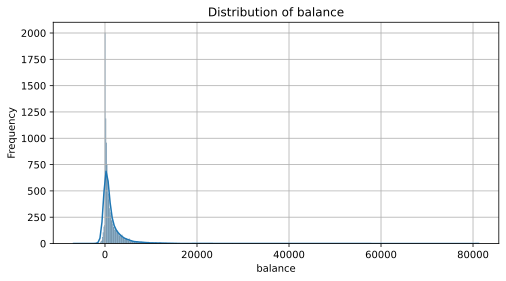

In [15]:
# вывод гистограммы
plot_hist_numeric(df, 'balance')

* Сильная правосторонняя асимметрия: среднее (1 528,54) заметно выше медианы (550,00) — это признак длинного «тяжёлого» правого хвоста;
* Высокая вариативность: стандартное отклонение (3 225,41) почти вдвое превышает среднее — данные сильно разбросаны;
* Широкий диапазон: от −6 847 до 81 204 (разброс более чем в 10 раз относительно среднего);
* Межквартильный размах (IQR = 1 586): основная масса наблюдений лежит между 1‑м (122) и 3‑м (1 708) квартилями, то есть в интервале 122–1 708.

*Необходимо сделать логарифмировнаие признака 'balance', создать новые признаки: размер долга, маркер должника. Ввод новых признаков для обучения модели LightGBM*.

*Анализ признака **duration***:
* график гистграммы скошен вправо, имеет смысл взять логарифм;
* нельзя использовать duration в финальной модели.

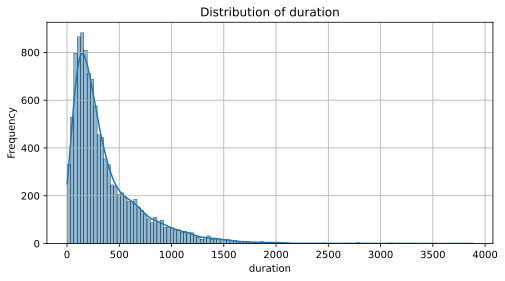

In [16]:
# вывод гистограммы
plot_hist_numeric(df, 'duration')

*Ярко выраженная сильная правосторонняя асимметрия (скошенность вправо). Не думаю, что стоит удалять "выбросы" - звонки. Надежней - сделать логарифмирование*

In [17]:
# логарифмирование признака 
'''
df['log_duration'] = np.log1p(df['duration'])
# вывод гистограммы
plot_hist_numeric(df, 'log_duration')

'''

"\ndf['log_duration'] = np.log1p(df['duration'])\n# вывод гистограммы\nplot_hist_numeric(df, 'log_duration')\n\n"

*Анализ признака **age***:
* в данном признаке фиксируем выбросы, которые необходимо удлаить;
* гистограмма скошена вправо, стоит провести логарифмирование.

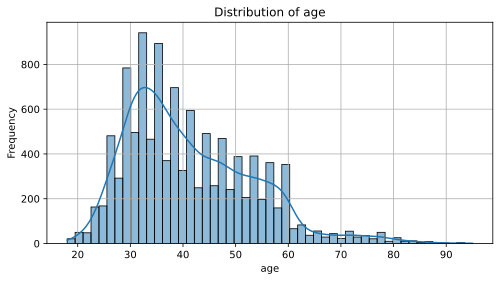

In [18]:
# вывод гистограммы
plot_hist_numeric(df, 'age')

*По гарвафику с усами можем сделать предположение, что люди старше 75 лет являются выбросами. Удалим клиентов старше 75 лет*

In [19]:
# удаляем выбросы
'''
df = df[df['age']<=75]
# логарифмирование признака 
df['log_age'] = np.log1p(df['age'])
# вывод гистограммы
plot_hist_numeric(df, 'log_age')

'''

"\ndf = df[df['age']<=75]\n# логарифмирование признака \ndf['log_age'] = np.log1p(df['age'])\n# вывод гистограммы\nplot_hist_numeric(df, 'log_age')\n\n"

*Анализ признака **campaign***:
* фиксируем выбросы: по формуле статистки, верхний/нижний "ус" =  медиана +- 1,5*IQR = (0.10, 3.10), считаю, что клиентов, которые выходят за данный интервал стоит удалить...

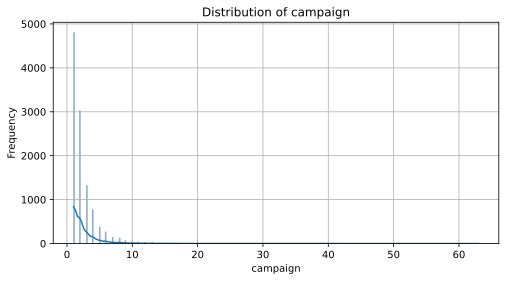

In [20]:
# вывод гистограммы
plot_hist_numeric(df, 'campaign')

In [21]:
# удалим клиентов, с которыми контактировали более 4 раз за кампанию 
'''
df = df[df['campaign']<=4]
# вывод гистограммы
plot_hist_numeric(df, 'campaign')

'''

"\ndf = df[df['campaign']<=4]\n# вывод гистограммы\nplot_hist_numeric(df, 'campaign')\n\n"

## 2.5 Анализ качесвтенных признаков

In [22]:
# вывод списка категориальных признаков 
print(categorical_features)

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'deposit']


### *Анализ признака **job***

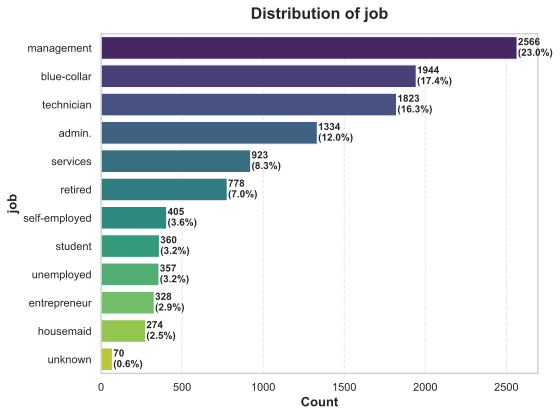

Статистика для 'job':
  Unique categories: 12
  Total count: 11162

Top categories:
  management: 2566 (23.0%)
  blue-collar: 1944 (17.4%)
  technician: 1823 (16.3%)
  admin.: 1334 (12.0%)
  services: 923 (8.3%)
  retired: 778 (7.0%)
  self-employed: 405 (3.6%)
  student: 360 (3.2%)
  unemployed: 357 (3.2%)
  entrepreneur: 328 (2.9%)


In [23]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'job')


* Доминирующая группа — management (23 %). Почти каждый четвёртый клиент в выборке — менеджер. Это может быть сильным сегментом для кампании: у них обычно выше доход/баланс и другая чувствительность к предложениям;
* «Тяжёлое» ядро из топ‑3: management + blue‑collar + technician = 57,2 % всей выборки. То есть больше половины клиентов попадают в эти три категории. Если модель будет плохо предсказывать конверсию именно для них — общая метрика сильно просядет;
* Средние категории (admin., services): ещё ~20 %. Это тоже значимые группы, их нельзя игнорировать;
* Малые категории (от retired и ниже): суммарно ~23 %, но каждая по отдельности уже небольшая (от 6 % и ниже). Для редких классов (вроде entrepreneur с 2,9 %) модель может просто не набрать достаточно примеров, чтобы выучить паттерн.


In [24]:
# проведем объединение малых групп клиентов в подгруппу outher
'''
job_counts = df['job'].value_counts(normalize = True) # находим доли специальностей клиентов

list_smol_job = job_counts[job_counts <= 0.06].index.tolist() # список названий специальностей с маленькой долей

df.loc[df['job'].isin(list_smol_job), 'job'] = 'other' # замена

'''

"\njob_counts = df['job'].value_counts(normalize = True) # находим доли специальностей клиентов\n\nlist_smol_job = job_counts[job_counts <= 0.06].index.tolist() # список названий специальностей с маленькой долей\n\ndf.loc[df['job'].isin(list_smol_job), 'job'] = 'other' # замена\n\n"

### *Анализ признака **marital***

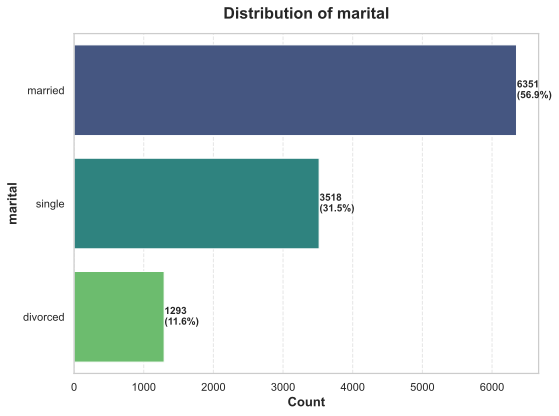

Статистика для 'marital':
  Unique categories: 3
  Total count: 11162

Top categories:
  married: 6351 (56.9%)
  single: 3518 (31.5%)
  divorced: 1293 (11.6%)


In [25]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'marital')

* Всего 3 категории, нет редких «хвостов», и распределение вполне сбалансированное (никакой категории с 1–2% нет);
* married (в браке) — 6 351 человек (56,9 %);
* single (не в браке / холост / незамужем) — 3 518 человек (31,5 %);
* divorced (в разводе) — 1 293 человека (11,6 %).

### *Анализ признака **education***

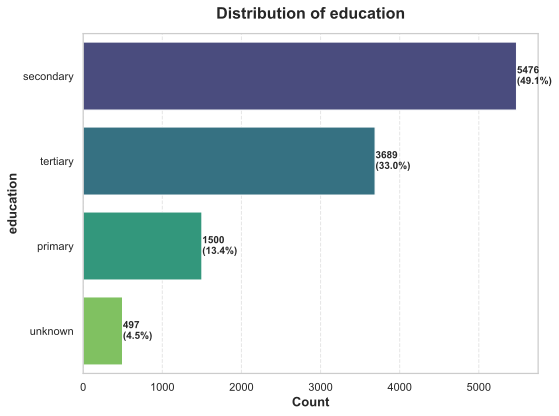

Статистика для 'education':
  Unique categories: 4
  Total count: 11162

Top categories:
  secondary: 5476 (49.1%)
  tertiary: 3689 (33.0%)
  primary: 1500 (13.4%)
  unknown: 497 (4.5%)


In [26]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'education')

 Тут 'unknown' надо объединить с 'primary', начальное образование вроде как все имеют...

In [27]:
# замена
'''
df['education'] = df['education'].replace('unknown', 'primary')
'''

"\ndf['education'] = df['education'].replace('unknown', 'primary')\n"

### *Анализ признака **default***

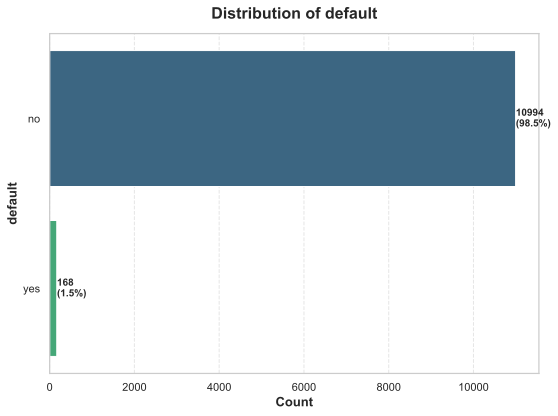

Статистика для 'default':
  Unique categories: 2
  Total count: 11162

Top categories:
  no: 10994 (98.5%)
  yes: 168 (1.5%)


In [28]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'default')

* Бинарный признак: только два значения — no и yes;
* Сильный дисбаланс классов: 98,5 % — no, 1,5 % — yes:
* Очень мало положительных случаев: всего 168 записей с yes — это критически мало для надёжной оценки влияния признака на целевую переменную;
* Риск недообучения на редком классе. Если целевая переменная тоже редкая (например, конверсия 10–15 %), модель может просто «игнорировать» группу yes, считая её шумом;
* Нельзя полагаться на accuracy. Точность вида «модель всегда предсказывает no и получает 98,5 % accuracy» будет обманчиво высокой. Нужны метрики, учитывающие дисбаланс: precision, recall, F1, ROC‑AUC, PR‑AUC;
* Высокий риск переобучения при кодировании. Из‑за малого числа yes любые сложные преобразования могут дать ложный эффект.

### *Анализ признака **housing***

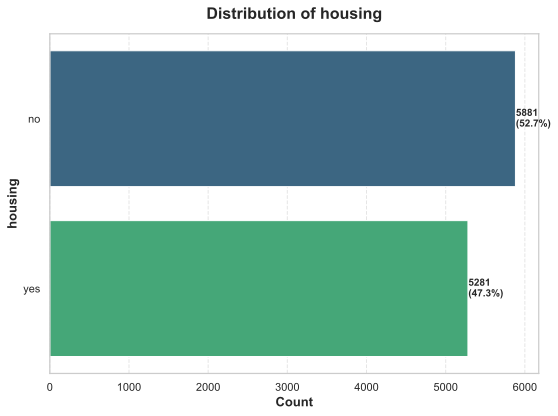

Статистика для 'housing':
  Unique categories: 2
  Total count: 11162

Top categories:
  no: 5881 (52.7%)
  yes: 5281 (47.3%)


In [29]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'housing')

* Бинарный признак: значения no и yes;
* Сбалансированное распределение: 52,7 % — no, 47,3 % — yes. Классы почти равны, сильного перекоса нет;
* Объём выборки: 11 162 наблюдения — статистически надёжная база для анализа.

### *Анализ признака **loan***

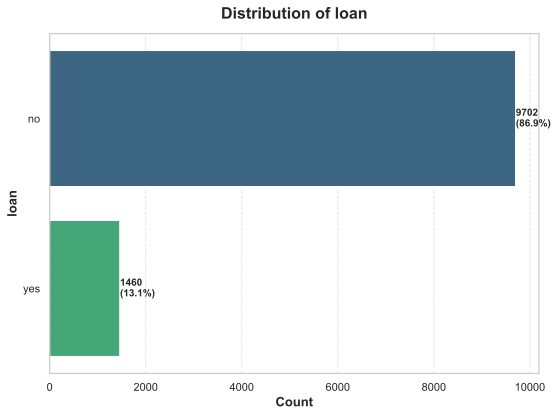

Статистика для 'loan':
  Unique categories: 2
  Total count: 11162

Top categories:
  no: 9702 (86.9%)
  yes: 1460 (13.1%)


In [30]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'loan')

* Бинарный признак: значения no и yes;
* Умеренный дисбаланс: 86,9 % — no, 13,1 % — yes. В отличие от default (где было всего 1,5 % редких случаев), здесь группа yes достаточно представительная (1 460 наблюдений) — её уже можно анализировать статистически;
* Объём выборки: 11 162 строки — надёжная база, чтобы не бояться, что редкие значения дадут шум.

### *Анализ признака **contact***

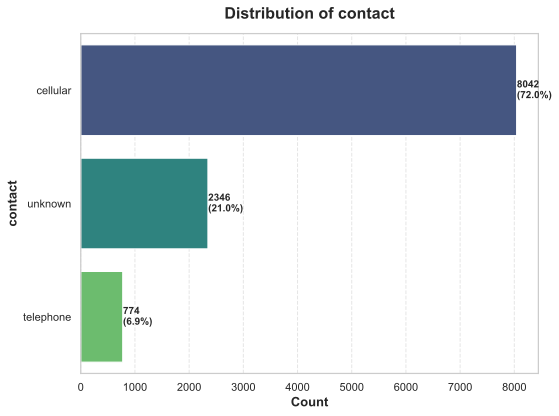

Статистика для 'contact':
  Unique categories: 3
  Total count: 11162

Top categories:
  cellular: 8042 (72.0%)
  unknown: 2346 (21.0%)
  telephone: 774 (6.9%)


In [31]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'contact')

* Категориальный признак с 3 уровнями: cellular, unknown, telephone;
* Умеренный дисбаланс: доминирует cellular (72 %), заметная доля unknown (21 %), и небольшая — telephone (6,9 %).

### *Анализ признака **month***

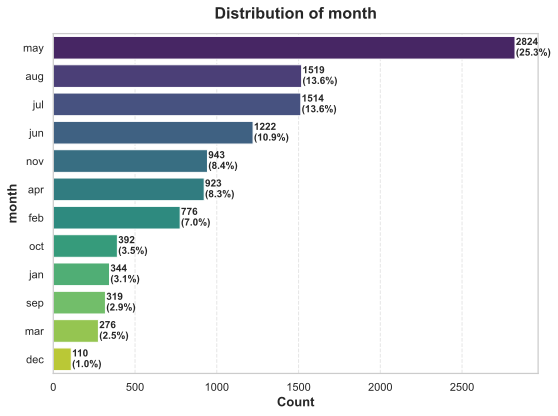

Статистика для 'month':
  Unique categories: 12
  Total count: 11162

Top categories:
  may: 2824 (25.3%)
  aug: 1519 (13.6%)
  jul: 1514 (13.6%)
  jun: 1222 (10.9%)
  nov: 943 (8.4%)
  apr: 923 (8.3%)
  feb: 776 (7.0%)
  oct: 392 (3.5%)
  jan: 344 (3.1%)
  sep: 319 (2.9%)


In [32]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'month')

* Категориальный признак, 12 значений (по месяцам);
* Ярко выраженная сезонность: почти четверть всех контактов — в мае (25,3 %), дальше идут август, июль, июнь (по 10–14 %);
* Сильный перекос: на топ‑4 месяца (may, aug, jul, jun) приходится ~63,4 % всех наблюдений. Остальные месяцы представлены слабо — особенно январь, сентябрь, октябрь (2,9–3,5 %).

### *Анализ признака **poutcome***

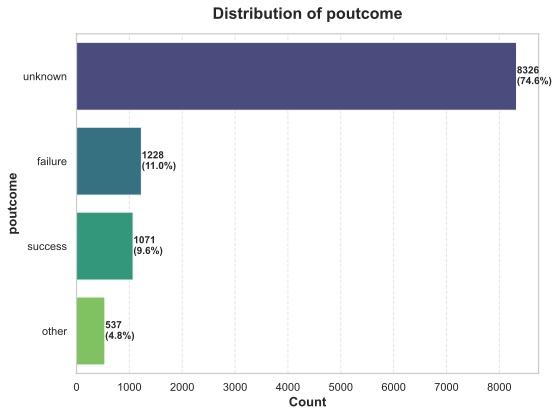

Статистика для 'poutcome':
  Unique categories: 4
  Total count: 11162

Top categories:
  unknown: 8326 (74.6%)
  failure: 1228 (11.0%)
  success: 1071 (9.6%)
  other: 537 (4.8%)


In [33]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'poutcome')

* Категориальный признак, 4 категории: unknown, failure, success, other;
* Сильный дисбаланс: 74,6 % — unknown, остальные категории суммарно 25,4 %;
* Редкие, но смысловые категории: success (9,6 %) и failure (11 %) — это как раз те клиенты, по которым есть конкретная история отклика; other (4,8 %) — скорее всего, смешанная группа (например, «не участвовал», «отказ по другой причине» и т.п.).

### *Анализ признака **deposit***

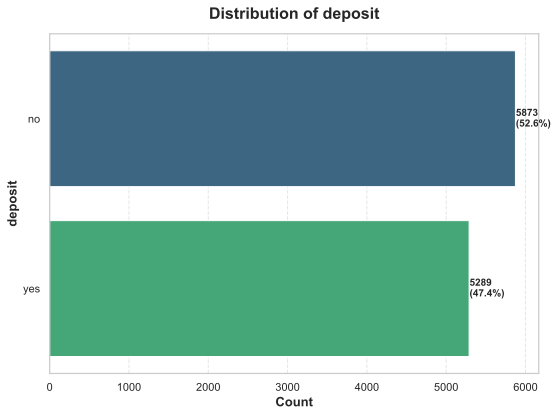

Статистика для 'deposit':
  Unique categories: 2
  Total count: 11162

Top categories:
  no: 5873 (52.6%)
  yes: 5289 (47.4%)


In [34]:
# воспользуемся столбчатой диаграммой для визуализации
plot_bar_categorical(df,'deposit')

* Бинарный признак: значения no и yes;
* Практически сбалансированное распределение: 52,6 % — no, 47,4 % — yes. Перекос минимальный (разница всего 5,2 п. п.), поэтому признак не требует балансировки.

# 3. Изучение взаимосвязей между признаками

## 3.1 Матрица корреляции

*Задача текущего блока - провести проверку на мультиколлинеарность между входными признаками, определить какие признаки больше всего коррелируют с целевым признаком...*

In [35]:
# посмотрим на корреляцию числовых признаков
corr_matrix = df.drop(categorical_features, axis=1).corr()

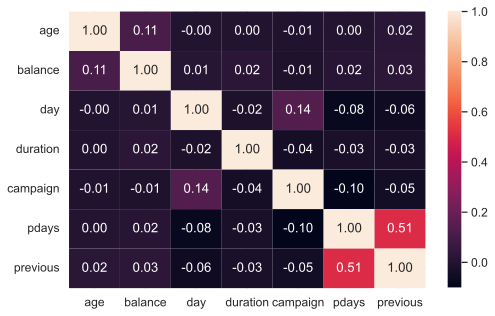

In [36]:
sns.heatmap(corr_matrix, annot = True, fmt = '.2f');

*Мультиколлинеарности между числовыми признаками не обнаружены...*

interval columns not set, guessing: ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']


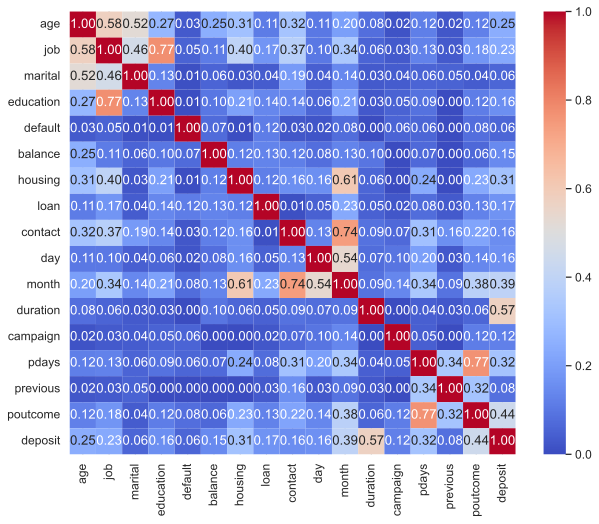

In [37]:
# поскольку в нашем датасете присутствуют категориальные признаки, используем корреляцию phik, которая способна с ними работать
plot_phik(df)

*Обнаружили сильную линейную зависимость между признаками:*
* job vs age;
* marital vs age;
* marital vs job;
* deposit vs duration;
* pdays vs poutcome;
* job vs education;
* contact vs month.

## 3.2 Изучение корреляций между выбранными парами

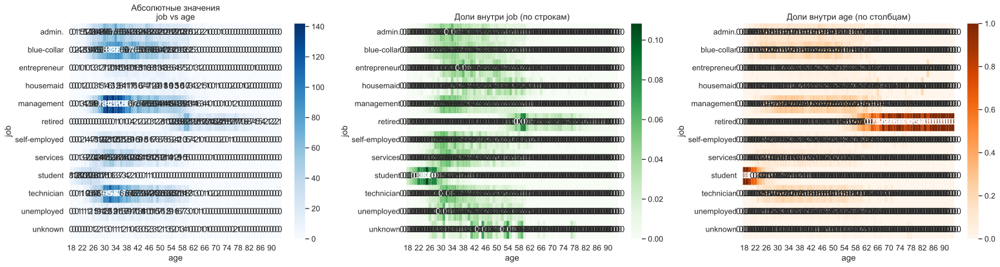

In [38]:
plot_categorical_relationship(df, 'job',  'age')

Установлено следующие:
* возраст на должности *студент* имеет интервал от 18 до 28;
* в датафрейме есть клиенты, которые вышщи на пенсию (от 53 до 95);
* возраст сотрудников по всем группа от 23 до 58 лет.

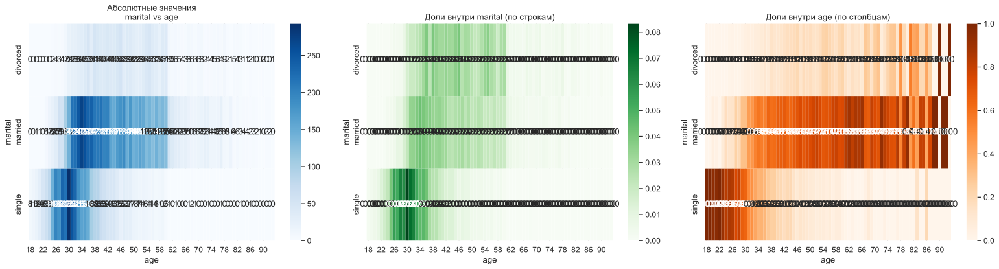

In [39]:
plot_categorical_relationship(df, 'marital', 'age')

Установлено следующие:
* большая часть клиентов в супружеских отношениях (возраст от 28 до 63 лет);
* возраст оиночек от 23 до 35;
* возраст у разведенных распределен равномерно.

In [40]:
plot_categorical_relationship(df, 'deposit', 'duration')

Установлено следующие:
* большая часть клиентов, которые оформили депозит продолжали разговор от 154 секунд;
* клиенты, которые не оформили депозит, разговаривали до 154 секунд. 

# 4. Выводы и дальнейшие шаги

* *balance* имеет огромный разброс (от −6847 до 81 204) -> Необходимо сделать логарифмировнаие признака 'balance', создать новые признаки: размер долга, маркер должника. Ввод новых признаков для обучения модели LightGBM;
* Ярко выраженная сильная правосторонняя асимметрия признака *duration* (скошенность вправо). Не думаю, что стоит удалять "выбросы" - звонки. Надежней - сделать логарифмирование;
* По признаку *age* можем сделать предположение, что люди старше 75 лет являются выбросами. Удалим клиентов старше 75 лет c последующем логарифмированием;
* Удалим клиентов, с которыми контактировали более 4 раз за кампанию (признак *campaign*);

* Проведем объединение малых групп клиентов в подгруппу outher признака *job*;
* В признаке *ededucation* 'unknown' надо объединить с 'primary' (начальное образование вроде как все имеют);
* В признаке *default* жуткий дисбаланс классов, легче удалить данный признак, ибо он даже не коррелирует с целевым признаком;



# 5. Препроцессинг данных

Препроцессинг данных можно разделить на две основные категории:

1. **Общие преобразования** – применяются ко всему датасету до разделения на train и test.
2. **Индивидуальные преобразования** – выполняются отдельно для тренировочной и тестовой выборок.

**Почему такое разделение необходимо?**

Некоторые преобразования требуют расчета статистик (например, замена пропусков медианой, стандартизация, частотное кодирование) или даже обучения вспомогательных моделей (например, KNN для импутации пропущенных значений). Если применить такие преобразования ко всему датасету до разделения, это приведет к **data leakage (утечке данных)**.

**Что такое data leakage и чем он опасен?**

Data leakage возникает, когда информация из тестового набора неявно влияет на preprocessing тренировочных данных (например, при расчете среднего или обучении encoder'а). В результате:

* Модель получает доступ к данным, которых не должно "знать" в реальных условиях;
* Оценки качества становятся завышенными, но на новых данных модель работает хуже.

**Как избежать утечки данных?**

1. **Сначала разделять** данные на train и test (или использовать кросс-валидацию).
2. **Обучать preprocessing-алгоритмы** (импутеры, энкодеры, скейлеры) **только на train**.
3. Применять обученные преобразования к test, **без пересчета статистик**.

Крайне рекомендуется использовать пайплайны (например, sklearn.pipeline.Pipeline), которые автоматически следят за корректным порядком преобразований.

**Какие преобразования можно применять ко всему датасету?**

Те, что не зависят от статистик и не требуют обучения:

* Удаление дубликатов.
* Исправление очевидных аномалий (например, отрицательный возраст).
* Разовые преобразования (изменение формата даты, переименование столбцов).
* Фильтрация строк/столбцов, не связанная с целевой переменной.

Такой подход помогает избежать дублирования кода, сохраняя при этом валидность эксперимента.

## 5.1 Общие преобразования

In [41]:
# создадим независимую копию исходного DataFrame df
df_preprocessed = df.copy()

### *Работа по признаку **balance**:*

In [42]:
# создание новых признаков
df_preprocessed['has_debt'] = (df_preprocessed['balance'] < 0).astype(int)
df_preprocessed['debt_amount'] = df_preprocessed['balance'].clip(upper=0).abs()      # размер долга
df_preprocessed['positive_balance'] = df_preprocessed['balance'].clip(lower=0)       # только положительный баланс

# Логарифмируем только положительные части (там, где есть смысл)
df_preprocessed['log_positive_balance'] = np.log1p(df_preprocessed['positive_balance'])
df_preprocessed['log_debt_amount'] = np.log1p(df_preprocessed['debt_amount'])

In [43]:
# добавляем введенные признаки в список numerical_features

numerical_features = numerical_features + [
    'has_debt',
    'debt_amount',
    'positive_balance',
    'log_positive_balance',
    'log_debt_amount'
]

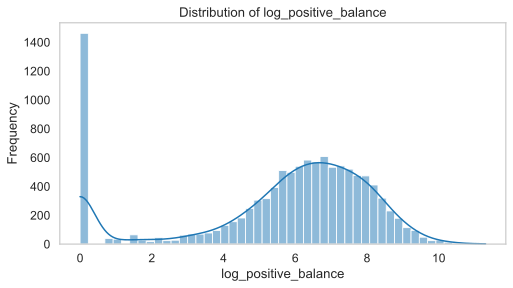

In [44]:
# вывод гистограммы
plot_hist_numeric(df_preprocessed, 'log_positive_balance')

### *Работа по признаку **duration**:*

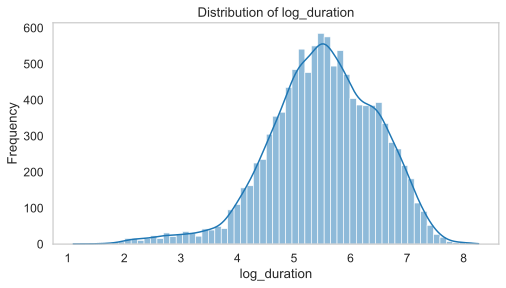

In [45]:
# логарифмирование признака 
df_preprocessed['log_duration'] = np.log1p(df_preprocessed['duration'])
# вывод гистограммы
plot_hist_numeric(df_preprocessed, 'log_duration')

### *Работа по признаку **age**:*

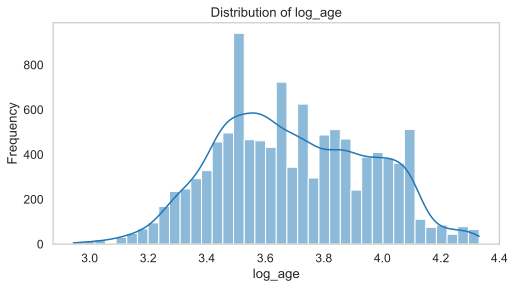

In [46]:
# удаляем выбросы
df_preprocessed= df_preprocessed[df_preprocessed['age']<=75]
# логарифмирование признака 
df_preprocessed['log_age'] = np.log1p(df_preprocessed['age'])
# вывод гистограммы
plot_hist_numeric(df_preprocessed, 'log_age')


### *Работа по признаку **campaign**:*

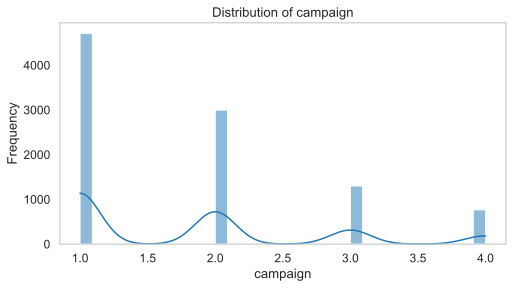

In [47]:
# удалим клиентов, с которыми контактировали более 4 раз за кампанию 

df_preprocessed = df_preprocessed[df_preprocessed['campaign']<=4]
# вывод гистограммы
plot_hist_numeric(df_preprocessed, 'campaign')


### *Работа по признаку **job**:*

In [48]:
# проведем объединение малых групп клиентов в подгруппу outher

job_counts = df_preprocessed['job'].value_counts(normalize = True) # находим доли специальностей клиентов

list_smol_job = job_counts[job_counts <= 0.06].index.tolist() # список названий специальностей с маленькой долей

df_preprocessed.loc[df_preprocessed['job'].isin(list_smol_job), 'job'] = 'other' # замена

df_preprocessed['job'].value_counts(normalize = True) # прверка замены

job
management     0.229793
other          0.221813
blue-collar    0.177000
technician     0.165439
admin.         0.122775
services       0.083180
Name: proportion, dtype: float64

### *Работа по признаку **ededucation**:*

In [49]:
# в признаке ededucation 'unknown' надо объединить с 'primary'
df_preprocessed['education'] = df_preprocessed['education'].replace('unknown', 'primary')

df_preprocessed['education'].value_counts(normalize = True) # прверка замены

education
secondary    0.497238
tertiary     0.333947
primary      0.168815
Name: proportion, dtype: float64

### *Работа по признаку **default**:*

In [50]:
# удаление признака 'default'
df_preprocessed = df_preprocessed.drop('default', axis=1)

## 5.2 Разбиение исходного датасета

In [51]:
# делим данные на признаки и таргет
X, y = divide_data(df_preprocessed, 'deposit')

In [52]:
# Разбиваем данные на train и test с соотношением 80 на 20
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=SEED, 
    # stratify сохраняет пропорции классов как в исходных данных:
    # 1) Гарантирует, что в train и test попадут представители всех классов
    # 2) Особенно важно для несбалансированных данных
    # 3) Позволяет получить репрезентативные выборки
    # 4) Исключает случайное отсутствие редких классов в подвыборках
    stratify=y  
)

In [53]:
# вывод первых пяти строк входных признаков
X_train

,age,job,marital,education,balance,housing,loan,contact,day,month,...,pdays,previous,poutcome,has_debt,debt_amount,positive_balance,log_positive_balance,log_debt_amount,log_duration,log_age
2699,54,other,divorced,secondary,1664,no,no,cellular,15,sep,...,105,3,success,0,0,1664,7.417580,0.00000,4.672829,4.007333
1432,27,other,single,secondary,2614,no,no,cellular,8,apr,...,-1,0,unknown,0,0,2614,7.869019,0.00000,4.969813,3.332205
9621,35,technician,single,secondary,-89,yes,no,cellular,15,may,...,368,1,failure,1,89,0,0.000000,4.49981,4.330733,3.583519
10958,53,services,married,primary,257,yes,no,unknown,5,may,...,-1,0,unknown,0,0,257,5.552960,0.00000,5.347108,3.988984
9822,37,management,single,tertiary,0,no,no,cellular,7,jul,...,-1,0,unknown,0,0,0,0.000000,0.00000,6.467699,3.637586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3089,64,other,married,secondary,588,no,no,cellular,18,jan,...,91,2,failure,0,0,588,6.378426,0.00000,5.905362,4.174387
8965,31,other,single,tertiary,1489,yes,no,cellular,3,feb,...,-1,0,unknown,0,0,1489,7.306531,0.00000,6.520621,3.465736
5218,30,services,married,secondary,517,no,no,cellular,11,dec,...,-1,0,unknown,0,0,517,6.249975,0.00000,4.955827,3.433987
7555,42,services,single,secondary,247,yes,no,cellular,31,jul,...,-1,0,unknown,0,0,247,5.513429,0.00000,4.744932,3.761200


In [54]:
# создадим компию тренировочной выборки
X_train_preprocessed = X_train.copy()

In [55]:
# вспомним какие признаки категориальные, а какие количественные
print(numerical_features)
categorical_features.remove('default')
categorical_features.remove('deposit')
print(categorical_features)

['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous', 'has_debt', 'debt_amount', 'positive_balance', 'log_positive_balance', 'log_debt_amount']
['job', 'marital', 'education', 'housing', 'loan', 'contact', 'month', 'poutcome']


## 5.2 Кодирование категориальных признаков

In [56]:
# Будем использовать порядковое кодирование. Для этого выпишем все категории для каждого столбца в порядке увеличения номера
category_orders = [
    ['services', 'admin.', 'technician', 'blue-collar', 'other', 'management'], # job
    ['divorced', 'single', 'married'], # marital
    ['primary', 'tertiary', 'secondary'], # education
    ['yes', 'no'], # housing
    ['yes', 'no'], # loan
    ['telephone', 'unknown', 'cellular'], # contact
    ['dec', 'mar', 'sep', 'jan', 'oct', 'feb', 'apr', 'nov', 'jun', 'aug', 'jul', 'may'], # month
    ['other', 'success', 'failure', 'unknown'] # poutcome

]

encoder = OrdinalEncoder(categories=category_orders)
X_train_preprocessed[categorical_features] = encoder.fit_transform(X_train_preprocessed[categorical_features])

In [57]:
# посмотрим на результат работы кодировщика
X_train_preprocessed

,age,job,marital,education,balance,housing,loan,contact,day,month,...,pdays,previous,poutcome,has_debt,debt_amount,positive_balance,log_positive_balance,log_debt_amount,log_duration,log_age
2699,54,4.0,0.0,2.0,1664,1.0,1.0,2.0,15,2.0,...,105,3,1.0,0,0,1664,7.417580,0.00000,4.672829,4.007333
1432,27,4.0,1.0,2.0,2614,1.0,1.0,2.0,8,6.0,...,-1,0,3.0,0,0,2614,7.869019,0.00000,4.969813,3.332205
9621,35,2.0,1.0,2.0,-89,0.0,1.0,2.0,15,11.0,...,368,1,2.0,1,89,0,0.000000,4.49981,4.330733,3.583519
10958,53,0.0,2.0,0.0,257,0.0,1.0,1.0,5,11.0,...,-1,0,3.0,0,0,257,5.552960,0.00000,5.347108,3.988984
9822,37,5.0,1.0,1.0,0,1.0,1.0,2.0,7,10.0,...,-1,0,3.0,0,0,0,0.000000,0.00000,6.467699,3.637586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3089,64,4.0,2.0,2.0,588,1.0,1.0,2.0,18,3.0,...,91,2,2.0,0,0,588,6.378426,0.00000,5.905362,4.174387
8965,31,4.0,1.0,1.0,1489,0.0,1.0,2.0,3,5.0,...,-1,0,3.0,0,0,1489,7.306531,0.00000,6.520621,3.465736
5218,30,0.0,2.0,2.0,517,1.0,1.0,2.0,11,0.0,...,-1,0,3.0,0,0,517,6.249975,0.00000,4.955827,3.433987
7555,42,0.0,1.0,2.0,247,0.0,1.0,2.0,31,10.0,...,-1,0,3.0,0,0,247,5.513429,0.00000,4.744932,3.761200


In [58]:
# проверим типы данных. Мы видим, что все столбцы теперь числовые, что нам и требовалось
X_train_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7819 entries, 2699 to 4177
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   7819 non-null   int64  
 1   job                   7819 non-null   float64
 2   marital               7819 non-null   float64
 3   education             7819 non-null   float64
 4   balance               7819 non-null   int64  
 5   housing               7819 non-null   float64
 6   loan                  7819 non-null   float64
 7   contact               7819 non-null   float64
 8   day                   7819 non-null   int64  
 9   month                 7819 non-null   float64
 10  duration              7819 non-null   int64  
 11  campaign              7819 non-null   int64  
 12  pdays                 7819 non-null   int64  
 13  previous              7819 non-null   int64  
 14  poutcome              7819 non-null   float64
 15  has_debt              7

# 6. Построение базовой модели (baseline)

Мы сознательно строим baseline без тонкой настройки гиперпараметров и без продвинутой предобработки: это нужно, чтобы зафиксировать исходную точку. Только имея этот базовый результат, можно корректно измерять эффект от любых последующих изменений — будь то новые признаки, трансформации или подбор параметров.

In [59]:
# создадим компию тестовой выборки
X_test_preprocessed = X_test.copy()

# Очень важно: здесь уже вызываем transform без fit, чтобы не допустить обучения на тестовых данных
X_test_preprocessed[categorical_features] = encoder.transform(X_test[categorical_features])

feature_names = X_test_preprocessed.columns.to_list()

In [60]:
# проверим типы данных. Мы видим, что все столбцы теперь числовые, что нам и требовалось
X_test_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1955 entries, 3300 to 1811
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   1955 non-null   int64  
 1   job                   1955 non-null   float64
 2   marital               1955 non-null   float64
 3   education             1955 non-null   float64
 4   balance               1955 non-null   int64  
 5   housing               1955 non-null   float64
 6   loan                  1955 non-null   float64
 7   contact               1955 non-null   float64
 8   day                   1955 non-null   int64  
 9   month                 1955 non-null   float64
 10  duration              1955 non-null   int64  
 11  campaign              1955 non-null   int64  
 12  pdays                 1955 non-null   int64  
 13  previous              1955 non-null   int64  
 14  poutcome              1955 non-null   float64
 15  has_debt              1

## 6.1 Dummy Classifier

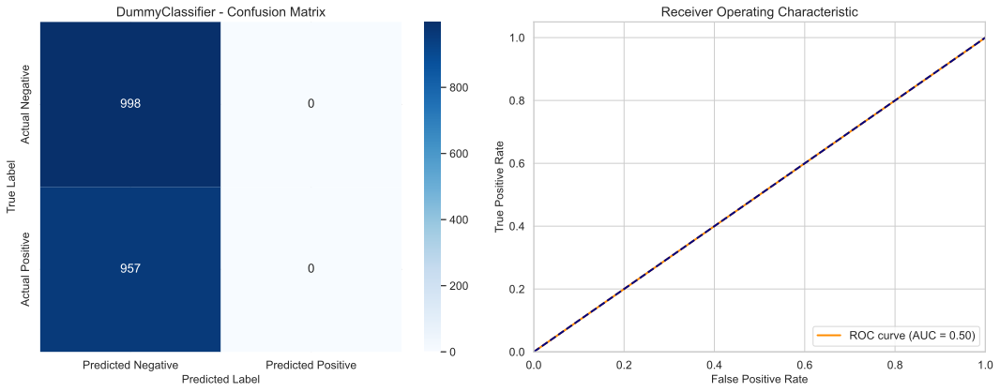


                 DUMMYCLASSIFIER EVALUATION                 

MAIN METRICS:
   Metric  Value
  ROC AUC 0.5000
 F1 Score 0.3380
Precision 0.2552
   Recall 0.5000
 Accuracy 0.5105


CLASSIFICATION REPORT:
   Class  Precision  Recall
Positive   0.000000     0.0
Negative   0.510486     1.0



In [61]:

# Задаем и обучаем модель
dummy_classifier = DummyClassifier(random_state=SEED, strategy='most_frequent')
dummy_classifier.fit(X_train_preprocessed, y_train)

# Получаем предсказания
y_pred = dummy_classifier.predict(X_test_preprocessed) # предсказываем номер класса
y_probs = dummy_classifier.predict_proba(X_test_preprocessed)[:, 1] # предсказываем вероятность (необходима для построения ROC кривой)

# Считаем метрики для модели и выводим графики
dummy_classifier_metrics = evaluate_classification(
    y_test=y_test,
    y_pred=y_pred,
    y_probs=y_probs,
    model_name="DummyClassifier"
)

ROC AUC = 0.5000 — ожидаемо: модель не ранжирует объекты, а просто выдаёт самый частый класс.
F1 Score = 0.3380 (macro): усреднение по обоим классам важно здесь, потому что нас интересуют
и клиенты, готовые открыть депозит (positive), и те, кто не готов (negative).
При binary-усреднении F1 считался бы только для положительного класса и был бы 0.0
(так как модель не предсказала ни одного 'yes').
   

## 6.2 Логистическая регрессия

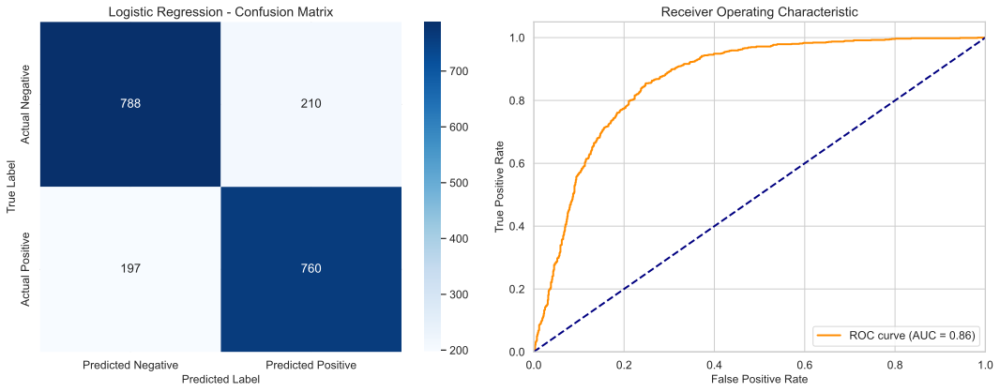


               LOGISTIC REGRESSION EVALUATION               

MAIN METRICS:
   Metric  Value
  ROC AUC 0.8648
 F1 Score 0.7918
Precision 0.7918
   Recall 0.7919
 Accuracy 0.7918


CLASSIFICATION REPORT:
   Class  Precision   Recall
Positive   0.783505 0.794148
Negative   0.800000 0.789579



In [62]:
log_reg = LogisticRegression(random_state=SEED, max_iter=1000, solver='liblinear')
log_reg.fit(X_train_preprocessed, y_train)

y_pred = log_reg.predict(X_test_preprocessed)
y_probs = log_reg.predict_proba(X_test_preprocessed)[:, 1]  

log_reg_metrics = evaluate_classification(
    y_test=y_test,
    y_pred=y_pred,
    y_probs=y_probs,
    model_name="Logistic Regression"
)

Логистическая регрессия как первый реальный классификатор.
ROC AUC = 0.8648 — заметный прирост относительно DummyClassifier (0.5).
F1 ≈ 0.79, Precision и Recall для Positive класса тоже ~0.78–0.79:
модель стабильно находит клиентов, готовых открыть депозит, и при этом не делает слишком много ложных срабатываний. Это хороший baseline для дальнейших улучшений.


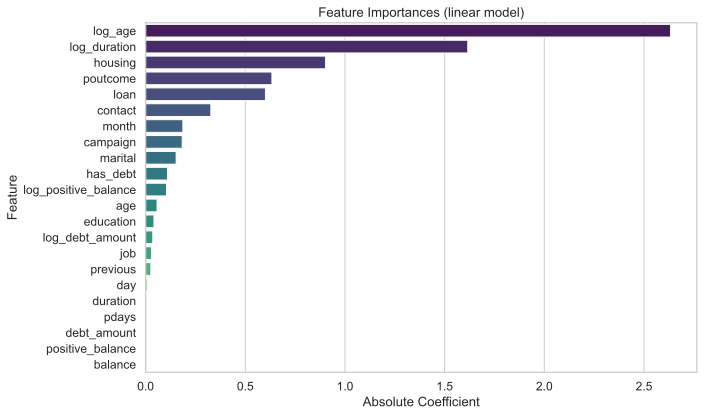

,Feature,Importance
21,log_age,2.633242
20,log_duration,1.615994
5,housing,0.902687
14,poutcome,0.633636
6,loan,0.601181
7,contact,0.327322
9,month,0.187016
11,campaign,0.183579
2,marital,0.153159
15,has_debt,0.109653


In [63]:
# Построим гистограмму важностей для каждой фичи
plot_feature_importance(log_reg, feature_names)

* *Главные драйверы модели*: log_age (2.63) и log_duration (1.62) — дают основной вклад в прогноз;
* Значимые признаки: housing, poutcome, loan (важность 0.6–0.9) — усиливают предсказания;
* Малозначимые: исходные версии метрик (balance, debt_amount и др.) почти не влияют — полезнее их преобразованные аналоги (логарифмы);
* Вывод: трансформации (логарифмирование) улучшили модель; топ‑признаки стоит сохранить, самые слабые — можно исключить для упрощения.

## 6.3 Дерево решений

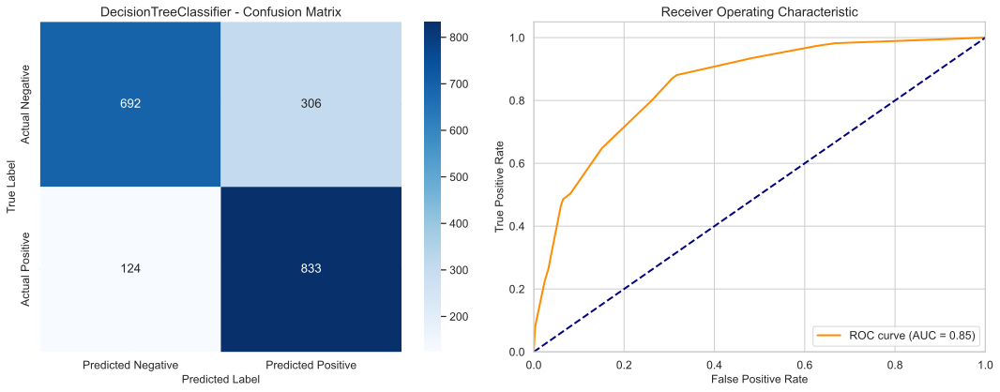


             DECISIONTREECLASSIFIER EVALUATION              

MAIN METRICS:
   Metric  Value
  ROC AUC 0.8501
 F1 Score 0.7789
Precision 0.7897
   Recall 0.7819
 Accuracy 0.7801


CLASSIFICATION REPORT:
   Class  Precision   Recall
Positive   0.731343 0.870428
Negative   0.848039 0.693387



In [64]:
decision_tree = DecisionTreeClassifier(random_state=SEED, max_depth=4)
decision_tree.fit(X_train_preprocessed, y_train)

y_pred = decision_tree.predict(X_test_preprocessed)
y_probs = decision_tree.predict_proba(X_test_preprocessed)[:, 1]  # For ROC curve

decision_tree_metrics = evaluate_classification(
    y_test=y_test,
    y_pred=y_pred,
    y_probs=y_probs,
    model_name="DecisionTreeClassifier"
)

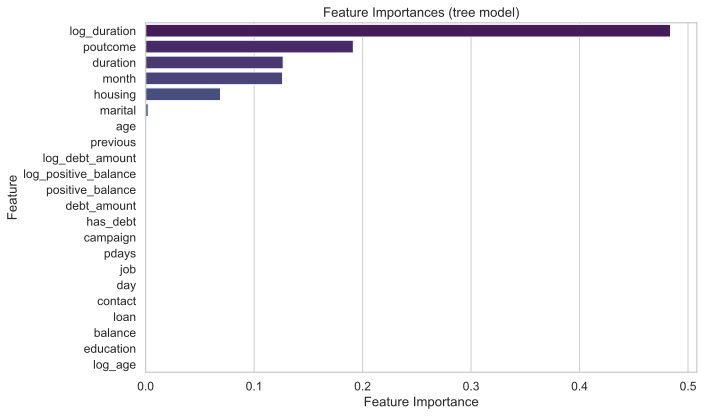

,Feature,Importance
20,log_duration,0.483899
14,poutcome,0.191490
10,duration,0.126822
9,month,0.126293
5,housing,0.069067
2,marital,0.002429
0,age,0.000000
13,previous,0.000000
19,log_debt_amount,0.000000
18,log_positive_balance,0.000000


In [65]:
plot_feature_importance(decision_tree, feature_names)

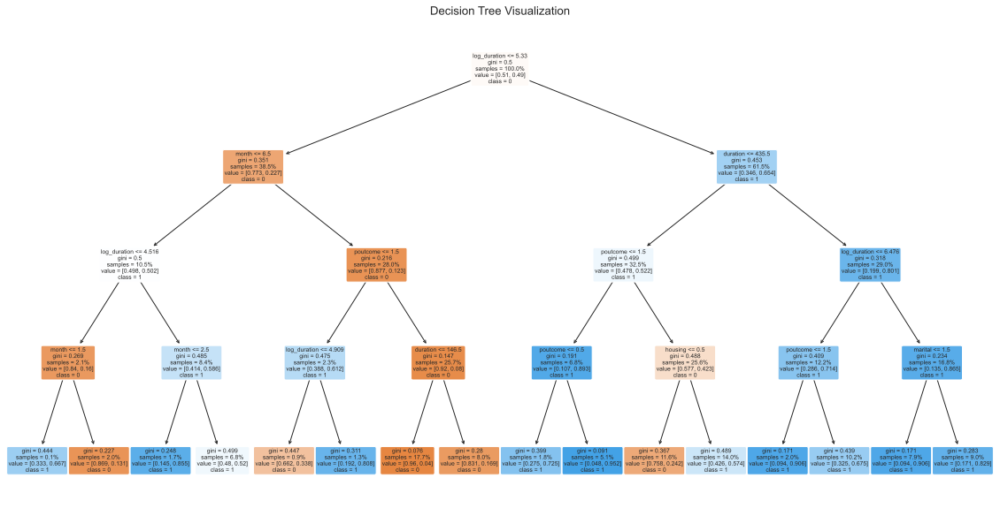

In [66]:
# Визуализируем наше дерево решений
visualize_decision_tree(decision_tree, feature_names, class_names=['0', '1'])

Оранжевым цветом изображены вершины с классом 0, синим - с классом 1. Значение value показывает, какая доля семплов в вершине относится к 0 и 1 классам соответственно. Samples показывает, какая доля всех семплов оказалась в этой вершине.


## 6.4 Случайный лес

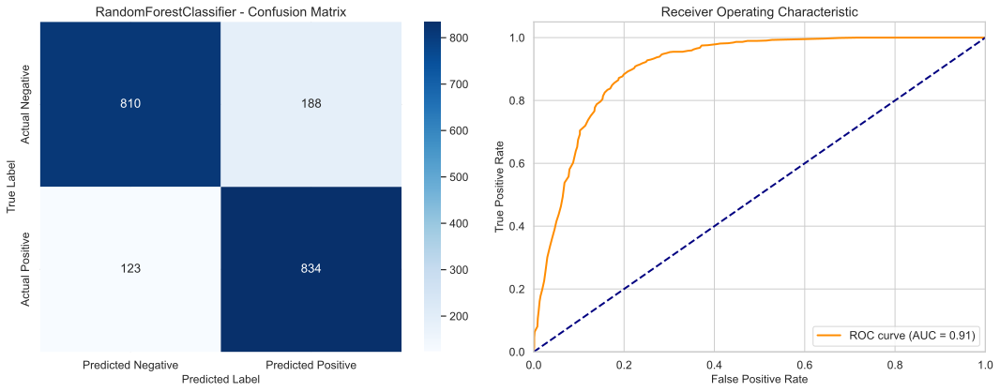


             RANDOMFORESTCLASSIFIER EVALUATION              

MAIN METRICS:
   Metric  Value
  ROC AUC 0.9056
 F1 Score 0.8409
Precision 0.8421
   Recall 0.8415
 Accuracy 0.8409


CLASSIFICATION REPORT:
   Class  Precision   Recall
Positive   0.816047 0.871473
Negative   0.868167 0.811623



In [67]:
# Обучение модели
random_forest = RandomForestClassifier(random_state=SEED)
random_forest.fit(X_train_preprocessed, y_train)

# Предсказание модели
y_pred = random_forest.predict(X_test_preprocessed)
y_probs = random_forest.predict_proba(X_test_preprocessed)[:, 1]  # For ROC curve

# Оценка качесвта модели
random_forest_metrics = evaluate_classification(
    y_test=y_test,
    y_pred=y_pred,
    y_probs=y_probs,
    model_name="RandomForestClassifier")

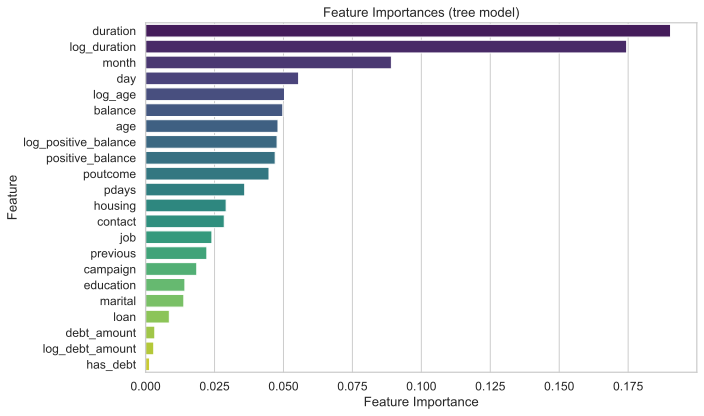

,Feature,Importance
10,duration,0.190378
20,log_duration,0.174458
9,month,0.089136
8,day,0.055498
21,log_age,0.050369
4,balance,0.049758
0,age,0.048011
18,log_positive_balance,0.047683
17,positive_balance,0.046994
14,poutcome,0.044748


In [68]:
plot_feature_importance(random_forest, feature_names)

* ROC AUC = 0.9056 — сильная способность ранжировать клиентов по риску: модель хорошо отделяет тех, кто уйдёт, от тех, кто останется;
* F1 = 0.8409 — удачный компромисс между точностью и полнотой: нет сильного перекоса в сторону одних ошибок;
* Сбалансированность по классам: для «Positive» (скорее всего, Churn=1) полнота выше (0.871), для «Negative» — точность выше (0.868). То есть модель не «забывает» про оттокников и при этом не раздает ложные тревоги всем подряд.

## 6.5 Градиентный бустинг

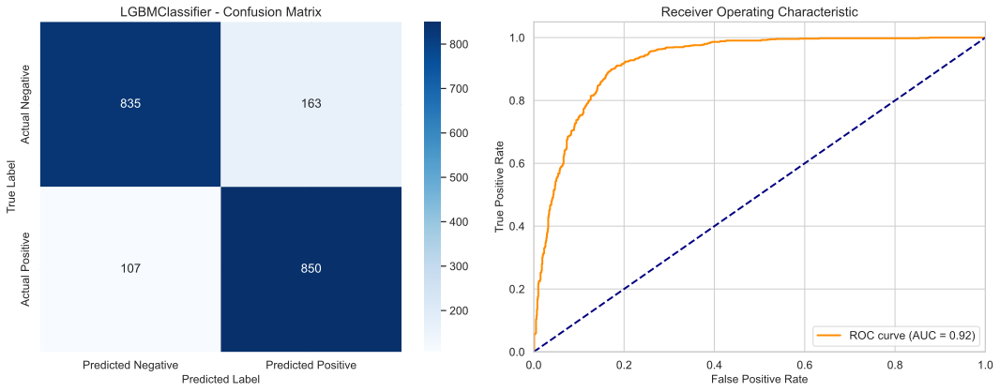


                 LGBMCLASSIFIER EVALUATION                  

MAIN METRICS:
   Metric  Value
  ROC AUC 0.9240
 F1 Score 0.8619
Precision 0.8628
   Recall 0.8624
 Accuracy 0.8619


CLASSIFICATION REPORT:
   Class  Precision   Recall
Positive   0.839092 0.888192
Negative   0.886412 0.836673



In [69]:
# Train your model
lgbm = LGBMClassifier(random_state=SEED)
lgbm.fit(X_train_preprocessed, y_train)

# Get predictions
y_pred = lgbm.predict(X_test_preprocessed)
y_probs = lgbm.predict_proba(X_test_preprocessed)[:, 1]  # For ROC curve

# Evaluate
lgbm_metrics = evaluate_classification(
    y_test=y_test,
    y_pred=y_pred,
    y_probs=y_probs,
    model_name="LGBMClassifier"
)

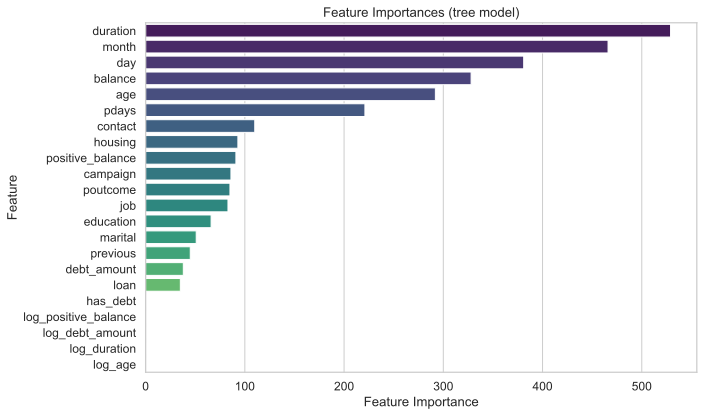

,Feature,Importance
10,duration,529
9,month,466
8,day,381
4,balance,328
0,age,292
12,pdays,221
7,contact,110
5,housing,93
17,positive_balance,91
11,campaign,86


In [70]:
plot_feature_importance(lgbm, feature_names)

* ROC AUC = 0.9240 (было ~0.9056) — модель ещё увереннее ранжирует клиентов по риску: граница между «уйдёт» и «останется» проводится точнее;
* F1 = 0.8619 и почти равные Precision/Recall (0.8628/0.8624) — баланс между ложными срабатываниями и пропущенными оттокниками стал ещё лучше;
* Сбалансированность по классам: для Positive (Churn=1) Recall = 0.888 — модель ловит большую долю тех, кто реально уходит; для Negative Precision = 0.886 — не «пугает» зря тех, кто останется.

## 6.6 Финальное сравнение метрик

In [71]:
final_metrics = {
    'dummy_classifier': dummy_classifier_metrics,
    'log_reg': log_reg_metrics,
    'decision_tree': decision_tree_metrics,
    'random_forest': random_forest_metrics,
    'lgbm': lgbm_metrics
}

result = pd.DataFrame(final_metrics.values(), index=final_metrics.keys())

In [72]:
result

,ROC AUC,F1 Score,Precision,Recall,Accuracy
dummy_classifier,0.500000,0.337961,0.255243,0.500000,0.510486
log_reg,0.864806,0.791773,0.791753,0.791864,0.791816
decision_tree,0.850122,0.778901,0.789691,0.781908,0.780051
random_forest,0.905601,0.840897,0.842107,0.841548,0.840921
lgbm,0.924024,0.861884,0.862752,0.862433,0.861893


<Axes: >

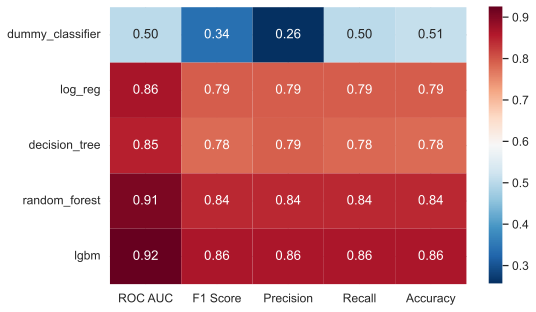

In [73]:
sns.heatmap(result, cmap='RdBu_r', annot=True, fmt=".2f")

* LGBM — лучший вариант по всем метрикам. ROC AUC = 0.924 и F1 = 0.862 означают, что модель уверенно ранжирует клиентов по риску оттока и при этом сбалансированно определяет классы: не пропускает оттокников (Recall = 0.862) и не даёт лишних ложных тревог (Precision = 0.863);
* Random Forest — достойный второе место (ROC AUC = 0.906), отстаёт от LGBM на ~0.02 по AUC. Хороший выбор, если нужна интерпретируемость через важность признаков;
* Logistic Regression уступает ансамблям (~0.865 по AUC), но даёт interpretable коэффициенты — полезна как бейзлайн и для понимания направления влияния признаков;
* Decision Tree — самый слабый из реальных моделей (0.850). Одиночное дерево склонно к переобучению, поэтому заметно проигрывает ансамблям;
* DummyClassifier (0.500 AUC) подтверждает, что все модели выше значительно лучше случайного угадывания.

Среди пяти обученных моделей лучшее качество показал LGBMClassifier: ROC AUC = 0.924, F1 = 0.862. Модель превосходит Random Forest на ~2 pp по AUC и сохраняет баланс точности и полноты по обоим классам. Логистическая регрессия и дерево решений служат корректными бейзлайнами, но заметно уступают ансамблевым методам. Для внедрения рекомендуется LGBM с дополнительной настройкой порога классификации под бизнес‑цели удержания.